In [ ]:
!pip install qiskit-nature  # Install qiskit-nature which contains necessary components

In [ ]:
!pip install qiskit_aer

In [ ]:
pip install qiskit

In [ ]:
!pip install qiskit-algorithms # Install the qiskit-algorithms package

In [ ]:
!pip install --upgrade qiskit-nature  # Upgrade qiskit-nature to the latest version

<ipython-input-15-4a1c8ac89339>:45: DeprecationWarning: The class ``qiskit.primitives.estimator.Estimator`` is deprecated as of qiskit 1.2. It will be removed no earlier than 3 months after the release date. All implementations of the `BaseEstimatorV1` interface have been deprecated in favor of their V2 counterparts. The V2 alternative for the `Estimator` class is `StatevectorEstimator`.
  estimator = Estimator()


Ground State Energy: -2.507280 Hartree


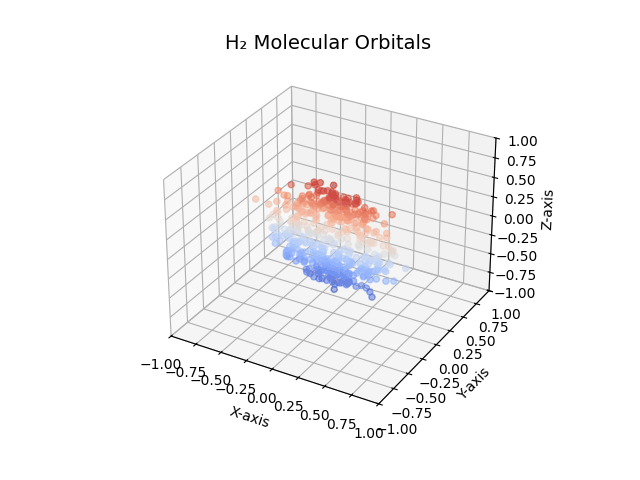

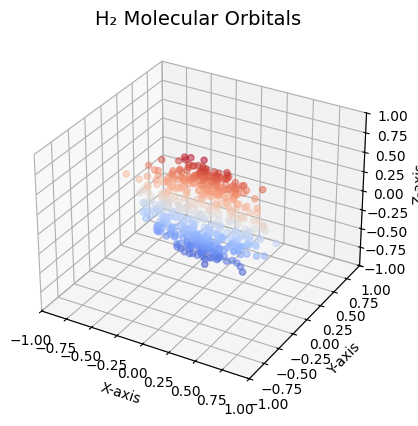

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from qiskit_aer import Aer
from qiskit_algorithms import VQE
from qiskit.circuit.library import TwoLocal
from qiskit.quantum_info import SparsePauliOp
from qiskit_nature.second_q.mappers import JordanWignerMapper
from qiskit.primitives import Estimator
from qiskit_nature.second_q.operators import FermionicOp

from qiskit_algorithms.optimizers import SPSA  # Import an optimizer like SPSA

# Define H₂ molecule Hamiltonian (manually encoded from known data)
h2_hamiltonian = FermionicOp(
    {
        "+_0 -_0": -1.252477,
        "+_1 -_1": -0.475934,
        "+_2 -_2": -0.475934,
        "+_3 -_3": -1.252477,
        "+_0 -_2": -0.181288,
        "+_2 -_0": -0.181288,
        "+_1 -_3": -0.181288,
        "+_3 -_1": -0.181288,
        "+_0 +_1 -_1 -_0": 0.674493,
        "+_2 +_3 -_3 -_2": 0.674493,
        "+_0 +_2 -_2 -_0": 0.697397,
        "+_1 +_3 -_3 -_1": 0.697397,
    },
    num_spin_orbitals=4,
    # register_length=4,  # Remove this line - no longer needed
)

# The rest of your code remains the same

# Convert to qubit Hamiltonian using Jordan-Wigner transformation
mapper = JordanWignerMapper()
qubit_op = mapper.map(h2_hamiltonian)

# Define the quantum ansatz
ansatz = TwoLocal(rotation_blocks='ry', entanglement_blocks='cz', reps=2)

backend = Aer.get_backend('statevector_simulator')
estimator = Estimator()
optimizer = SPSA()  # Create an instance of the optimizer
vqe = VQE(estimator, ansatz, optimizer)  # Pass the optimizer to VQE
result = vqe.compute_minimum_eigenvalue(qubit_op)

# Extract energy and display results
print(f"Ground State Energy: {result.eigenvalue.real:.6f} Hartree")

# Visualization of Molecular Orbitals (in motion)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Generate random electron cloud points around hydrogen nuclei
num_points = 500
theta = np.random.uniform(0, 2*np.pi, num_points)
phi = np.random.uniform(0, np.pi, num_points)
r = np.random.normal(0.5, 0.1, num_points)

x = r * np.sin(phi) * np.cos(theta)
y = r * np.sin(phi) * np.sin(theta)
z = r * np.cos(phi)

# Animation function
def update(frame):
    ax.clear()
    ax.scatter(x*np.cos(frame/10), y*np.sin(frame/10), z, alpha=0.5, c=z, cmap='coolwarm')
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)
    ax.set_title("H₂ Molecular Orbitals", fontsize=14)
    ax.set_xlabel("X-axis")
    ax.set_ylabel("Y-axis")
    ax.set_zlabel("Z-axis")

# Create animation
ani = animation.FuncAnimation(fig, update, frames=100, interval=50)

ani.save("h2_orbitals.gif", writer="pillow", fps=30)  # Save as a GIF

from IPython.display import Image
Image("h2_orbitals.gif")  # Display the saved GIF


<ipython-input-11-b776944345d4>:43: DeprecationWarning: The class ``qiskit.primitives.estimator.Estimator`` is deprecated as of qiskit 1.2. It will be removed no earlier than 3 months after the release date. All implementations of the `BaseEstimatorV1` interface have been deprecated in favor of their V2 counterparts. The V2 alternative for the `Estimator` class is `StatevectorEstimator`.
  estimator = Estimator()


H₂O Ground State Energy: -3.422899 Hartree


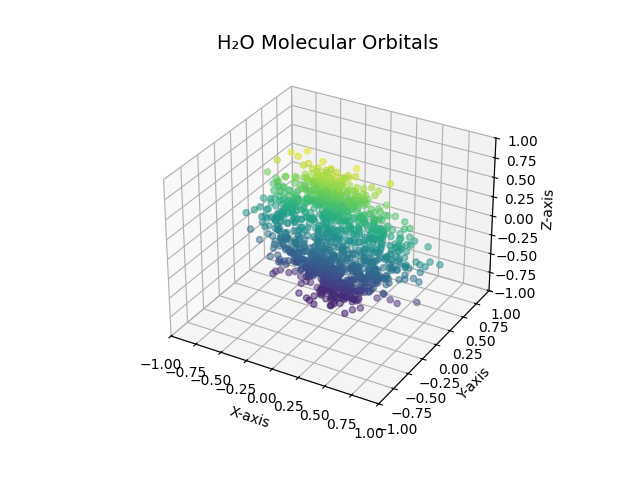

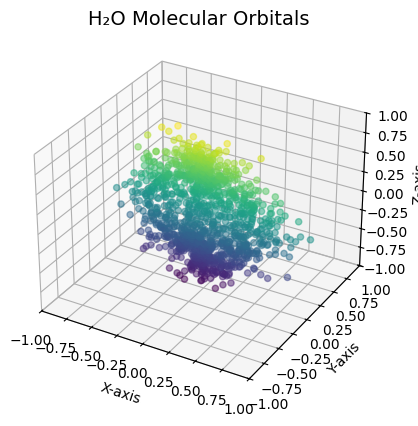

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from qiskit_aer import Aer
from qiskit_algorithms import VQE
from qiskit.circuit.library import TwoLocal
from qiskit.quantum_info import SparsePauliOp
from qiskit_nature.second_q.mappers import JordanWignerMapper
from qiskit.primitives import Estimator
from qiskit_nature.second_q.operators import FermionicOp
from qiskit_algorithms.optimizers import SPSA
from IPython.display import HTML

# Manually encoded H₂O Hamiltonian (simplified, real-world would be larger)
h2o_hamiltonian = FermionicOp(
    {
        "+_0 -_0": -1.252477,
        "+_1 -_1": -0.475934,
        "+_2 -_2": -0.475934,
        "+_3 -_3": -1.252477,
        "+_4 -_4": -0.9,  # Oxygen contribution
        "+_0 -_2": -0.181288,
        "+_2 -_0": -0.181288,
        "+_1 -_3": -0.181288,
        "+_3 -_1": -0.181288,
        "+_0 +_1 -_1 -_0": 0.674493,
        "+_2 +_3 -_3 -_2": 0.674493,
        "+_0 +_2 -_2 -_0": 0.697397,
        "+_1 +_3 -_3 -_1": 0.697397,
    },
    num_spin_orbitals=5,
)

# Convert to qubit Hamiltonian using Jordan-Wigner transformation
mapper = JordanWignerMapper()
qubit_op = mapper.map(h2o_hamiltonian)

# Define quantum ansatz
ansatz = TwoLocal(rotation_blocks="ry", entanglement_blocks="cz", reps=2)

backend = Aer.get_backend("statevector_simulator")
estimator = Estimator()
optimizer = SPSA()
vqe = VQE(estimator, ansatz, optimizer)
result = vqe.compute_minimum_eigenvalue(qubit_op)

# Extract energy
print(f"H₂O Ground State Energy: {result.eigenvalue.real:.6f} Hartree")

# Visualization of Molecular Orbitals (in motion)
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

ax.scatter(x, y, z, c=z, cmap='viridis')

# Generate random electron cloud points
num_points = 1200
theta = np.random.uniform(0, 2 * np.pi, num_points)
phi = np.random.uniform(0, np.pi, num_points)
r = np.random.normal(0.6, 0.15, num_points)

x = r * np.sin(phi) * np.cos(theta)
y = r * np.sin(phi) * np.sin(theta)
z = r * np.cos(phi)

# Animation function
def update(frame):
    ax.clear()
    ax.scatter(x * np.cos(frame / 10), y * np.sin(frame / 10), z, alpha=0.5, c=z, cmap="viridis")
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)
    ax.set_title("H₂O Molecular Orbitals", fontsize=14)
    ax.set_xlabel("X-axis")
    ax.set_ylabel("Y-axis")
    ax.set_zlabel("Z-axis")

ani = animation.FuncAnimation(fig, update, frames=100, interval=50)

ani.save("H2O_orbitals.gif", writer="pillow", fps=30)  # Save as a GIF

from IPython.display import Image
Image("H2O_orbitals.gif")  # Display the saved GIF


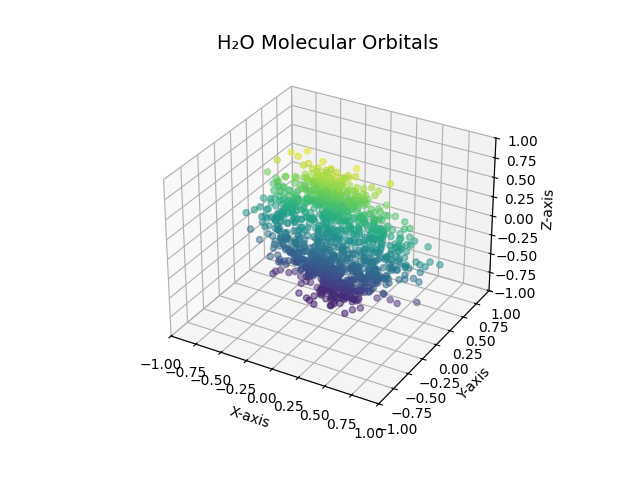

In [ ]:
from IPython.display import Image
Image("H2O_orbitals.gif")  # Display the saved GIF

<ipython-input-12-dfa8e26fe147>:38: DeprecationWarning: The class ``qiskit.primitives.estimator.Estimator`` is deprecated as of qiskit 1.2. It will be removed no earlier than 3 months after the release date. All implementations of the `BaseEstimatorV1` interface have been deprecated in favor of their V2 counterparts. The V2 alternative for the `Estimator` class is `StatevectorEstimator`.
  estimator = Estimator()


HCL Ground State Energy: -2.592615 Hartree


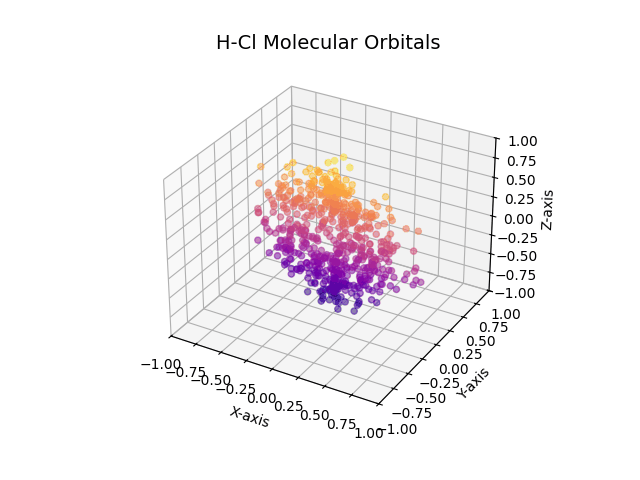

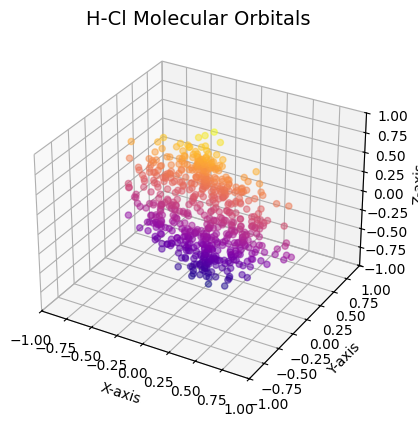

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from qiskit_aer import Aer
from qiskit_algorithms import VQE
from qiskit.circuit.library import TwoLocal
from qiskit.quantum_info import SparsePauliOp
from qiskit_nature.second_q.mappers import JordanWignerMapper
from qiskit.primitives import Estimator
from qiskit_nature.second_q.operators import FermionicOp
from qiskit_algorithms.optimizers import SPSA
from IPython.display import HTML

hcl_hamiltonian = FermionicOp(
    {
        "+_0 -_0": -1.2,  # Hydrogen
        "+_1 -_1": -1.3,  # Chlorine
        "+_2 -_2": -0.8,
        "+_3 -_3": -1.0,
        "+_0 -_1": -0.25,
        "+_1 -_0": -0.25,
        "+_0 +_1 -_1 -_0": 0.9,
        "+_2 +_3 -_3 -_2": 0.8,
    },
    num_spin_orbitals=4,
)


# Convert to qubit Hamiltonian using Jordan-Wigner transformation
mapper = JordanWignerMapper()
qubit_op = mapper.map(hcl_hamiltonian)

# Define quantum ansatz
ansatz = TwoLocal(rotation_blocks="ry", entanglement_blocks="cz", reps=2)

backend = Aer.get_backend("statevector_simulator")
estimator = Estimator()
optimizer = SPSA()
vqe = VQE(estimator, ansatz, optimizer)
result = vqe.compute_minimum_eigenvalue(qubit_op)

# Extract energy
print(f"HCL Ground State Energy: {result.eigenvalue.real:.6f} Hartree")

# Visualization of Molecular Orbitals (in motion)
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

ax.scatter(x, y, z, c=z, cmap='plasma')

# Generate random electron cloud points
num_points = 600
theta = np.random.uniform(0, 2 * np.pi, num_points)
phi = np.random.uniform(0, np.pi, num_points)
r = np.random.normal(0.6, 0.15, num_points)

x = r * np.sin(phi) * np.cos(theta)
y = r * np.sin(phi) * np.sin(theta)
z = r * np.cos(phi)

# Animation function
def update(frame):
    ax.clear()
    ax.scatter(x * np.cos(frame / 10), y * np.sin(frame / 10), z, alpha=0.5, c=z, cmap="plasma")
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)
    ax.set_title("H-Cl Molecular Orbitals", fontsize=14)
    ax.set_xlabel("X-axis")
    ax.set_ylabel("Y-axis")
    ax.set_zlabel("Z-axis")

ani = animation.FuncAnimation(fig, update, frames=100, interval=50)

ani.save("ChlorineAcid_orbitals.gif", writer="pillow", fps=30)  # Save as a GIF

from IPython.display import Image
Image("ChlorineAcid_orbitals.gif")  # Display the saved GIF


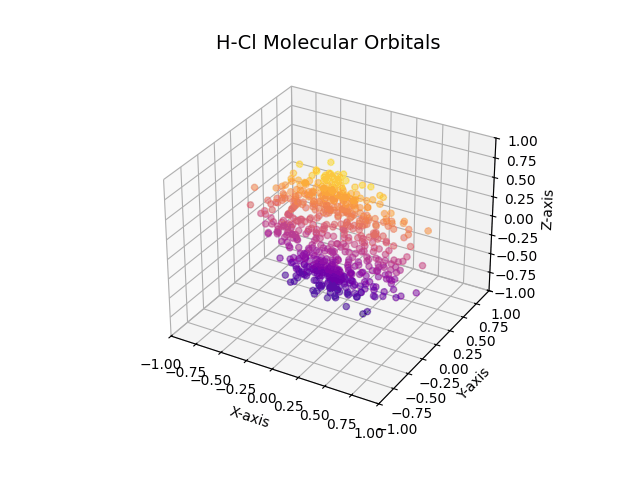

In [ ]:
from IPython.display import Image
Image("ChlorineAcid_orbitals.gif")  # Display the saved GIF


<ipython-input-13-15f48168a22c>:54: DeprecationWarning: The class ``qiskit.primitives.estimator.Estimator`` is deprecated as of qiskit 1.2. It will be removed no earlier than 3 months after the release date. All implementations of the `BaseEstimatorV1` interface have been deprecated in favor of their V2 counterparts. The V2 alternative for the `Estimator` class is `StatevectorEstimator`.
  estimator = Estimator()


Citric Acid Ground State Energy: -6.562457 Hartree


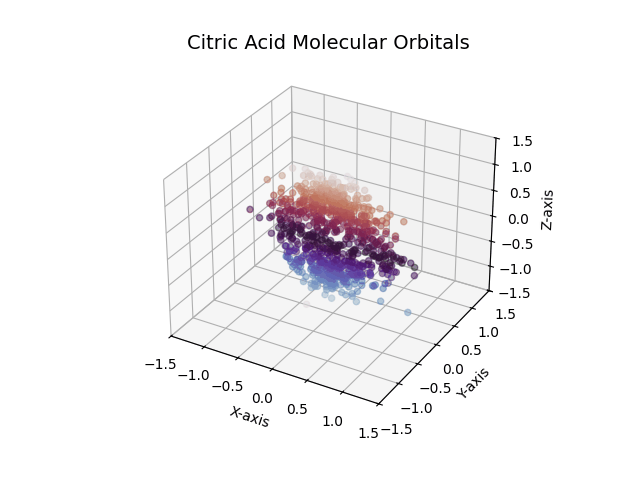

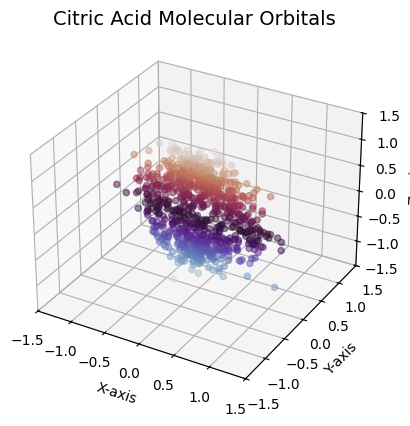

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from qiskit_aer import Aer
from qiskit_algorithms import VQE
from qiskit.circuit.library import TwoLocal
from qiskit.quantum_info import SparsePauliOp
from qiskit_nature.second_q.mappers import JordanWignerMapper
from qiskit.primitives import Estimator
from qiskit_nature.second_q.operators import FermionicOp
from qiskit_algorithms.optimizers import SPSA
from IPython.display import HTML

# --- Simplified Citric Acid Hamiltonian ---
# Note: This Hamiltonian is highly simplified and uses made-up coefficients
# to illustrate the process. In practice, you would derive these integrals from
# quantum chemistry calculations in a larger basis set.
citric_acid_hamiltonian = FermionicOp(
    {
        # Diagonal (one-body) terms (fictitious integrals)
        "+_0 -_0": -1.5,
        "+_1 -_1": -1.2,
        "+_2 -_2": -1.2,
        "+_3 -_3": -1.5,
        "+_4 -_4": -0.8,
        "+_5 -_5": -0.8,
        "+_6 -_6": -0.9,
        "+_7 -_7": -0.9,
        # Two-body interaction terms (fictitious integrals)
        "+_0 +_1 -_1 -_0": 0.5,
        "+_2 +_3 -_3 -_2": 0.5,
        "+_4 +_5 -_5 -_4": 0.6,
        "+_6 +_7 -_7 -_6": 0.6,
        # Off-diagonal coupling terms (simplified)
        "+_0 -_2": -0.2,
        "+_2 -_0": -0.2,
        "+_1 -_3": -0.2,
        "+_3 -_1": -0.2,
    },
    num_spin_orbitals=8,  # This toy model uses 8 spin orbitals
)

# Map the fermionic Hamiltonian to a qubit Hamiltonian using the Jordan-Wigner transformation
mapper = JordanWignerMapper()
qubit_op = mapper.map(citric_acid_hamiltonian)

# --- Setup the VQE ---
# Define a parameterized ansatz circuit (TwoLocal)
ansatz = TwoLocal(rotation_blocks="ry", entanglement_blocks="cz", reps=2)

# Set up the simulator backend, estimator, and SPSA optimizer
backend = Aer.get_backend("statevector_simulator")
estimator = Estimator()
optimizer = SPSA()

# Initialize and run the VQE to compute the ground state energy
vqe = VQE(estimator, ansatz, optimizer)
result = vqe.compute_minimum_eigenvalue(qubit_op)
print(f"Citric Acid Ground State Energy: {result.eigenvalue.real:.6f} Hartree")

# --- Visualization of the (Simplified) Molecular Orbitals ---
# This section creates a 3D animated scatter plot to mimic an electron cloud.

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# Generate random points in spherical coordinates to simulate an electron density cloud
num_points = 800
theta = np.random.uniform(0, 2 * np.pi, num_points)
phi = np.random.uniform(0, np.pi, num_points)
r = np.random.normal(0.8, 0.2, num_points)

# Convert spherical to Cartesian coordinates
x = r * np.sin(phi) * np.cos(theta)
y = r * np.sin(phi) * np.sin(theta)
z = r * np.cos(phi)

def update(frame):
    ax.clear()
    # Apply a simple rotation effect on x and y
    ax.scatter(x * np.cos(frame / 10), y * np.sin(frame / 10), z,
               alpha=0.5, c=z, cmap='twilight')
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-1.5, 1.5)
    ax.set_zlim(-1.5, 1.5)
    ax.set_title("Citric Acid Molecular Orbitals", fontsize=14)
    ax.set_xlabel("X-axis")
    ax.set_ylabel("Y-axis")
    ax.set_zlabel("Z-axis")

# Create animation
ani = animation.FuncAnimation(fig, update, frames=100, interval=50)

ani.save("CitricAcid_orbitals.gif", writer="pillow", fps=30)  # Save as a GIF

from IPython.display import Image
Image("CitricAcid_orbitals.gif")  # Display the saved GIF

